In [1]:
#Importing the relevant libraries
import scyan
import re
import anndata
import scanpy as sc
import os
import gc
import random
import pandas as pd
import numpy as np
from matplotlib import rcParams
import matplotlib.pyplot as plt
from pathlib import Path
from skimage.io  import imread
import skimage.io
import anndata as ad
import seaborn as sns 
from scipy import stats
import warnings
import matplotlib.cm as cm

c:\Users\Peter\anaconda3\envs\scyan\lib\site-packages\tqdm\auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm
c:\Users\Peter\anaconda3\envs\scyan\lib\site-packages\umap\distances.py:1063: NumbaDeprecationWarning: The 'nopython' keyword argument was not supplied to the 'numba.jit' decorator. The implicit default value for this argument is currently False, but it will be changed to True in Numba 0.59.0. See https://numba.readthedocs.io/en/stable/reference/deprecation.html#deprecation-of-object-mode-fall-back-behaviour-when-using-jit for details.
  @numba.jit()
c:\Users\Peter\anaconda3\envs\scyan\lib\site-packages\umap\distances.py:1071: NumbaDeprecationWarning: The 'nopython' keyword argument was not supplied to the 'numba.jit' decorator. The implicit default value for this argument is currently False, but it will be changed to True in Numba

In [2]:
sc.settings.verbosity = 3             # verbosity: errors (0), warnings (1), info (2), hints (3)
sc.logging.print_header()
warnings.filterwarnings('ignore')
sc.settings.set_figure_params(dpi=300, facecolor='white')

scanpy==1.9.3 anndata==0.8.0 umap==0.5.3 numpy==1.23.4 scipy==1.9.1 pandas==1.5.3 scikit-learn==1.2.2 statsmodels==0.14.0 python-igraph==0.10.4 pynndescent==0.5.10


In [42]:
#set up the base directory
base_dir = 'C:\\Users\\Peter\\Documents\\Internship_DKFZ\\Visual_coding_studio\\ark-analysis-0.6.3\\data\\preprint\\2023-07-18-KK-BC25_21_1_KK003'
#set up the directory with the cell tables after running cellpose
cell_table_dir = os.path.join(base_dir, "segmentation\\cell_table")
segmentation_dir = os.path.join(base_dir, "segmentation\\deepcell_visualization")
image_dir = os.path.join(base_dir, "image_data\\")

In [43]:
os.chdir(base_dir)

In [44]:
#cell size normalized tables
df = pd.read_csv(os.path.join(cell_table_dir,'cell_table_size_normalized.csv'))

In [45]:
#Getting the names of the columns in order to define the relevant channels
df.columns

Index(['cell_size', 'ASCT2', 'ATP5A', 'Au', 'CAV', 'CD11c', 'CD138', 'CD163',
       'CD20', 'CD21', 'CD23', 'CD3', 'CD36', 'CD4', 'CD45', 'CD56', 'CD68',
       'CD8', 'CD98', 'CPT1A', 'CS', 'CXCL13', 'CytC', 'FOXP3', 'Fe', 'GLS',
       'GLUT1', 'GZMB', 'HLADQA1', 'HLADR', 'HLAI', 'IL10', 'Ki67', 'Membrane',
       'Noodle', 'Nuclei', 'PD1', 'PDL1', 'PKM2', 'PanCK', 'SMA', 'TCF', 'Tox',
       'chan_39', 'chan_48', 'chan_69', 'chan_71', 'label', 'area',
       'eccentricity', 'major_axis_length', 'minor_axis_length', 'perimeter',
       'convex_area', 'equivalent_diameter', 'centroid-0', 'centroid-1',
       'major_minor_axis_ratio', 'perim_square_over_area',
       'major_axis_equiv_diam_ratio', 'convex_hull_resid', 'centroid_dif',
       'num_concavities', 'fov'],
      dtype='object')

In [46]:
#Renaming the X and Y coordinates
df = df.rename(columns={"centroid-0":"X",
                    "centroid-1":"Y"})

# define channels and background list to be removed
channels = ['ASCT2', 'ATP5A', 'CAV', 'CD11c', 'CD138', 'CD163',
       'CD20', 'CD21', 'CD23', 'CD3', 'CD36', 'CD4', 'CD45', 'CD56', 'CD68',
       'CD8', 'CD98', 'CPT1A', 'CS', 'CXCL13', 'CytC', 'FOXP3', 'GLS',
       'GLUT1', 'GZMB', 'HLADQA1', 'HLADR', 'HLAI', 'IL10', 'Ki67',
       'PD1', 'PDL1', 'PKM2', 'PanCK', 'SMA', 'TCF', 'Tox']



background = ['chan_39', 'chan_48', 'chan_69', 'chan_71', 'Au', 'Noodle', 'Fe', 'Membrane', 'Nuclei',]
Morphology = ['cell_size','area', 'eccentricity', 'major_axis_length',
       'minor_axis_length', 'perimeter', 'convex_area', 'equivalent_diameter', 
       'major_minor_axis_ratio','perim_square_over_area', 'major_axis_equiv_diam_ratio',
       'convex_hull_resid', 'centroid_dif','major_minor_axis_ratio', 'perim_square_over_area',
       'major_axis_equiv_diam_ratio', 'convex_hull_resid', 'centroid_dif',
       'num_concavities', 'fov', 'url', 'AreaShape_Center_X',
       'AreaShape_Center_X_1', 'AreaShape_Center_Y', 'AreaShape_Center_Y_1',
       'NuclearIntensity']
       

# define observations and name of coordinates in order to load it into the anndata format
#can be any kind of metadata, fov_number, patient_ID, tissue_type, batch... - for squidpy need to put the X,Y into
# X.obsm - dont know how yet

obs_list = ["fov",'X','Y'] 

In [47]:
print(df)

       cell_size     ASCT2         ATP5A           Au       CAV     CD11c  \
0          120.0  0.000005  0.000000e+00    24.365727  0.000091  0.000025   
1           65.0  0.002473  1.810602e-04   195.351487  0.001438  0.000133   
2           61.0  0.000221  6.536518e-06    26.969348  0.005336  0.000000   
3          166.0  0.000190  3.666730e-04   155.558947  0.000068  0.000021   
4          111.0  0.000122  2.615421e-03   733.755912  0.000000  0.000178   
...          ...       ...           ...          ...       ...       ...   
25518      143.0  0.000056  0.000000e+00  1216.845389  0.000000  0.000184   
25519      136.0  0.001070  7.096023e-07     4.039682  0.000007  0.000001   
25520       57.0  0.000057  1.660324e-03    41.705789  0.011937  0.000383   
25521       66.0  0.000000  0.000000e+00   337.847982  0.002838  0.000538   
25522      122.0  0.000024  1.632945e-04  1836.512551  0.000000  0.001506   

          CD138     CD163      CD20          CD21  ...  equivalent_diameter

In [48]:
# drop background channels
df = df.drop(background, axis = 1)

In [49]:
print(channels)
len(channels)

['ASCT2', 'ATP5A', 'CAV', 'CD11c', 'CD138', 'CD163', 'CD20', 'CD21', 'CD23', 'CD3', 'CD36', 'CD4', 'CD45', 'CD56', 'CD68', 'CD8', 'CD98', 'CPT1A', 'CS', 'CXCL13', 'CytC', 'FOXP3', 'GLS', 'GLUT1', 'GZMB', 'HLADQA1', 'HLADR', 'HLAI', 'IL10', 'Ki67', 'PD1', 'PDL1', 'PKM2', 'PanCK', 'SMA', 'TCF', 'Tox']


37

In [50]:
print(df["fov"].unique())

['2023-07-18-KK-BC25_21_1_FOV1' '2023-07-18-KK-BC25_21_1_FOV2'
 '2023-07-18-KK-BC25_21_1_FOV3' '2023-07-18-KK-BC25_21_1_FOV4'
 '2023-07-18-KK-BC25_21_1_FOV5' '2023-07-18-KK-BC25_21_1_FOV6']


In [51]:
# define the fovs you want to get rid of
values_to_remove = []

# Filter the DataFrame to exclude rows containing the values
df = df[~df['fov'].isin(values_to_remove)]



In [52]:
print(df["fov"].unique())

['2023-07-18-KK-BC25_21_1_FOV1' '2023-07-18-KK-BC25_21_1_FOV2'
 '2023-07-18-KK-BC25_21_1_FOV3' '2023-07-18-KK-BC25_21_1_FOV4'
 '2023-07-18-KK-BC25_21_1_FOV5' '2023-07-18-KK-BC25_21_1_FOV6']


In [53]:
##i duplicate the fov column and call it roi, so i can rename them and use it for the future data
df['roi'] = df['fov']

In [54]:
#If you wanna rename the fovs, i will call them rois now:

df['roi']= df['roi'].replace({ '2023-07-18-KK-BC25_21_1_FOV1' : 'BC25_21_1_FOV1', 
'2023-07-18-KK-BC25_21_1_FOV2' : 'BC25_21_1_FOV2',
'2023-07-18-KK-BC25_21_1_FOV3' : 'BC25_21_1_FOV3',
'2023-07-18-KK-BC25_21_1_FOV4' : 'BC25_21_1_FOV4',
'2023-07-18-KK-BC25_21_1_FOV5' : 'BC25_21_1_FOV5',
'2023-07-18-KK-BC25_21_1_FOV6' : 'BC25_21_1_FOV6',})



In [55]:

df.head()

,cell_size,ASCT2,ATP5A,CAV,CD11c,CD138,CD163,CD20,CD21,CD23,...,X,Y,major_minor_axis_ratio,perim_square_over_area,major_axis_equiv_diam_ratio,convex_hull_resid,centroid_dif,num_concavities,fov,roi
0,120.0,0.000005,0.000000,0.000091,0.000025,0.000000,0.0,0.000000,0.000000,0.000000,...,2.733333,818.466667,2.758645,18.007345,1.689639,0.062500,0.020808,0.0,2023-07-18-KK-BC25_21_1_FOV1,BC25_21_1_FOV1
1,65.0,0.002473,0.000181,0.001438,0.000133,0.000683,0.0,0.000007,0.000000,0.000076,...,2.261538,920.184615,2.058365,14.071036,1.448841,0.029851,0.016378,0.0,2023-07-18-KK-BC25_21_1_FOV1,BC25_21_1_FOV1
2,61.0,0.000221,0.000007,0.005336,0.000000,0.000084,0.0,0.000000,0.000055,0.000004,...,3.295082,937.180328,1.338272,12.760358,1.168181,0.061538,0.015469,0.0,2023-07-18-KK-BC25_21_1_FOV1,BC25_21_1_FOV1
3,166.0,0.000190,0.000367,0.000068,0.000021,0.000193,0.0,0.000034,0.000049,0.000022,...,3.879518,396.066265,2.289267,16.378327,1.538881,0.045977,0.013903,0.0,2023-07-18-KK-BC25_21_1_FOV1,BC25_21_1_FOV1
4,111.0,0.000122,0.002615,0.000000,0.000178,0.003822,0.0,0.000000,0.000004,0.000003,...,4.360360,454.324324,1.095980,13.224687,1.063955,0.067227,0.017323,0.0,2023-07-18-KK-BC25_21_1_FOV1,BC25_21_1_FOV1


Quantile Filtering for size exclusion- if you are using filtered data pass this section

A way more robust approach is given is this answer, eliminating the bottom and top 1% of data. However, this eliminates a fixed fraction independant of the question if these data are really outliers. You might loose a lot of valid data, and on the other hand still keep some outliers if you have more than 1% or 2% of your data as outliers.

In [56]:
print(df)

       cell_size     ASCT2         ATP5A       CAV     CD11c     CD138  \
0          120.0  0.000005  0.000000e+00  0.000091  0.000025  0.000000   
1           65.0  0.002473  1.810602e-04  0.001438  0.000133  0.000683   
2           61.0  0.000221  6.536518e-06  0.005336  0.000000  0.000084   
3          166.0  0.000190  3.666730e-04  0.000068  0.000021  0.000193   
4          111.0  0.000122  2.615421e-03  0.000000  0.000178  0.003822   
...          ...       ...           ...       ...       ...       ...   
25518      143.0  0.000056  0.000000e+00  0.000000  0.000184  0.000009   
25519      136.0  0.001070  7.096023e-07  0.000007  0.000001  0.000028   
25520       57.0  0.000057  1.660324e-03  0.011937  0.000383  0.000012   
25521       66.0  0.000000  0.000000e+00  0.002838  0.000538  0.000000   
25522      122.0  0.000024  1.632945e-04  0.000000  0.001506  0.000322   

          CD163      CD20          CD21          CD23  ...            X  \
0      0.000000  0.000000  0.000000e

In [57]:
df['cell_size'].describe()

count    25523.000000
mean       311.180425
std        205.459807
min         15.000000
25%        159.000000
50%        263.000000
75%        412.000000
max       1476.000000
Name: cell_size, dtype: float64

In [58]:
df['cell_size'].head

<bound method NDFrame.head of 0        120.0
1         65.0
2         61.0
3        166.0
4        111.0
         ...  
25518    143.0
25519    136.0
25520     57.0
25521     66.0
25522    122.0
Name: cell_size, Length: 25523, dtype: float64>

In [59]:
#cols = df.select_dtypes('float').columns  # limits to a (float), b (int) and e (timedelta)
df_sub = df.loc[:, 'cell_size']

In [60]:
print(df_sub)
      

0        120.0
1         65.0
2         61.0
3        166.0
4        111.0
         ...  
25518    143.0
25519    136.0
25520     57.0
25521     66.0
25522    122.0
Name: cell_size, Length: 25523, dtype: float64


In [61]:

# Calculate the cutoff values for the top and bottom 1% using quantile()
q_low = df['cell_size'].quantile(0.01)
q_high = df['cell_size'].quantile(0.99)

#Filter the DataFrame to only include rows where 'cell_size' values are between the 1% quantiles
df_filtered = df[(df['cell_size'] > q_low) & (df['cell_size'] < q_high)]


In [62]:
print(df_filtered)

       cell_size     ASCT2         ATP5A       CAV     CD11c     CD138  \
0          120.0  0.000005  0.000000e+00  0.000091  0.000025  0.000000   
1           65.0  0.002473  1.810602e-04  0.001438  0.000133  0.000683   
2           61.0  0.000221  6.536518e-06  0.005336  0.000000  0.000084   
3          166.0  0.000190  3.666730e-04  0.000068  0.000021  0.000193   
4          111.0  0.000122  2.615421e-03  0.000000  0.000178  0.003822   
...          ...       ...           ...       ...       ...       ...   
25518      143.0  0.000056  0.000000e+00  0.000000  0.000184  0.000009   
25519      136.0  0.001070  7.096023e-07  0.000007  0.000001  0.000028   
25520       57.0  0.000057  1.660324e-03  0.011937  0.000383  0.000012   
25521       66.0  0.000000  0.000000e+00  0.002838  0.000538  0.000000   
25522      122.0  0.000024  1.632945e-04  0.000000  0.001506  0.000322   

          CD163      CD20          CD21          CD23  ...            X  \
0      0.000000  0.000000  0.000000e

In [63]:
df=df_filtered

Bringing the values up to CyTOF level:

In [64]:
# Change target directory
os.chdir('C:\\Users\\Peter\\Documents\\Internship_DKFZ\\Visual_coding_studio\\ark-analysis-0.6.3\\data\\output\\2023-07-18-KK-BC25_21_1_KK003')

In [65]:
#check the second last highest number- which value should you multiply it with so it reaches around 10000 and
#second lowest is around 100?

dco= df[channels].quantile(.9999)
dco=dco.sort_values(ascending=True)
print(dco)


# Save dco as CSV
dco.to_csv("sorted_top99percentile_markers_mesmerv2.csv", header=True)

median = dco.median()
median_name = dco[dco == median].index[0]
print(median)
print(median_name)

CD21       0.001030
PDL1       0.001449
Tox        0.002609
TCF        0.002626
FOXP3      0.003490
CD23       0.003534
GLS        0.003745
CytC       0.003846
IL10       0.004906
CD163      0.005254
PD1        0.005304
CXCL13     0.006228
CPT1A      0.007492
CD138      0.010800
CS         0.011308
CD56       0.013347
ASCT2      0.013679
CD3        0.013747
Ki67       0.015854
CD11c      0.019294
ATP5A      0.019386
GZMB       0.022385
CD4        0.022698
CD98       0.022753
CD36       0.027564
CD68       0.028176
HLADQA1    0.032659
PKM2       0.033141
HLADR      0.040151
CD20       0.042141
GLUT1      0.045030
CD8        0.065439
CD45       0.075123
CAV        0.077942
PanCK      0.112716
HLAI       0.132787
SMA        0.526459
Name: 0.9999, dtype: float64
0.015853570574206426
Ki67


from above: the median number should be equal to 5000, so in this case =5000/ median


In [66]:
multiply= 5000/median
print(multiply)

315386.36527312914


In [67]:
df[channels] = df[channels].multiply(multiply)


In [68]:
df.head()

,cell_size,ASCT2,ATP5A,CAV,CD11c,CD138,CD163,CD20,CD21,CD23,...,X,Y,major_minor_axis_ratio,perim_square_over_area,major_axis_equiv_diam_ratio,convex_hull_resid,centroid_dif,num_concavities,fov,roi
0,120.0,1.486685,0.000000,28.762278,7.820215,0.000000,0.0,0.000000,0.000000,0.000000,...,2.733333,818.466667,2.758645,18.007345,1.689639,0.062500,0.020808,0.0,2023-07-18-KK-BC25_21_1_FOV1,BC25_21_1_FOV1
1,65.0,779.962459,57.103918,453.535244,41.820816,215.389057,0.0,2.309445,0.000000,23.865291,...,2.261538,920.184615,2.058365,14.071036,1.448841,0.029851,0.016378,0.0,2023-07-18-KK-BC25_21_1_FOV1,BC25_21_1_FOV1
2,61.0,69.851162,2.061529,1682.804818,0.000000,26.373822,0.0,0.000000,17.388247,1.301011,...,3.295082,937.180328,1.338272,12.760358,1.168181,0.061538,0.015469,0.0,2023-07-18-KK-BC25_21_1_FOV1,BC25_21_1_FOV1
3,166.0,59.847605,115.643667,21.322846,6.628621,60.756883,0.0,10.583716,15.302459,6.954773,...,3.879518,396.066265,2.289267,16.378327,1.538881,0.045977,0.013903,0.0,2023-07-18-KK-BC25_21_1_FOV1,BC25_21_1_FOV1
4,111.0,38.631166,824.868272,0.000000,56.262099,1205.542483,0.0,0.000000,1.143475,0.974430,...,4.360360,454.324324,1.095980,13.224687,1.063955,0.067227,0.017323,0.0,2023-07-18-KK-BC25_21_1_FOV1,BC25_21_1_FOV1


In [69]:
#save the new dataframe as csv :

df.to_csv(os.path.join(cell_table_dir,('cell_table_size_normalized_mesmerv2_filtered_cytoflevel.csv')), index=False)


In [70]:
#Read in the df if you are starting after cytof brought up data:

df = pd.read_csv(os.path.join(cell_table_dir,'cell_table_size_normalized_mesmerv2_filtered_cytoflevel.csv'))


##make sure you check the data: 
print(df)

       cell_size       ASCT2       ATP5A          CAV       CD11c  \
0          120.0    1.486685    0.000000    28.762278    7.820215   
1           65.0  779.962459   57.103918   453.535244   41.820816   
2           61.0   69.851162    2.061529  1682.804818    0.000000   
3          166.0   59.847605  115.643667    21.322846    6.628621   
4          111.0   38.631166  824.868272     0.000000   56.262099   
...          ...         ...         ...          ...         ...   
24994      143.0   17.768081    0.000000     0.000000   58.095192   
24995      136.0  337.344611    0.223799     2.244616    0.348053   
24996       57.0   17.946476  523.643545  3764.807356  120.746622   
24997       66.0    0.000000    0.000000   895.104949  169.690501   
24998      122.0    7.433770   51.500848     0.000000  475.025573   

             CD138      CD163        CD20       CD21       CD23  ...  \
0         0.000000    0.00000    0.000000   0.000000   0.000000  ...   
1       215.389057    0.000

In [71]:
#df= df.drop(df.columns[0], axis=1)

Arcsinh transforming data:

In [72]:
# Apply arcsin transformation with cofactor of 5 to selected columns
df[channels] = np.arcsinh(df[channels]/5)

# Print the updated DataFrame
print(df)

       cell_size     ASCT2     ATP5A       CAV     CD11c     CD138     CD163  \
0          120.0  0.293121  0.000000  2.450245  1.229771  0.000000  0.000000   
1           65.0  5.742965  3.130493  5.200813  2.820658  4.456290  0.000000   
2           61.0  3.331354  0.401436  6.511929  0.000000  2.364948  0.000000   
3          166.0  3.177251  3.834690  2.156960  1.094038  3.192278  0.000000   
4          111.0  2.741931  5.798942  0.000000  3.115699  6.178399  0.000000   
...          ...       ...       ...       ...       ...       ...       ...   
24994      143.0  1.980347  0.000000  0.000000  3.147639  0.538409  0.000000   
24995      136.0  4.904869  0.044745  0.435068  0.069555  1.321413  0.000000   
24996       57.0  1.989967  5.344543  7.317162  3.877832  0.675042  0.000000   
24997       66.0  0.000000  0.000000  5.880658  4.217902  0.000000  0.000000   
24998      122.0  1.187393  3.027656  0.000000  5.247106  3.706147  3.841309   

           CD20      CD21      CD23  ..

In [73]:
min_val = np.min(df[channels])
max_val = np.max(df[channels])

print("Minimum value:", min_val)
print("Maximum value:", max_val)

Minimum value: ASCT2      0.0
ATP5A      0.0
CAV        0.0
CD11c      0.0
CD138      0.0
CD163      0.0
CD20       0.0
CD21       0.0
CD23       0.0
CD3        0.0
CD36       0.0
CD4        0.0
CD45       0.0
CD56       0.0
CD68       0.0
CD8        0.0
CD98       0.0
CPT1A      0.0
CS         0.0
CXCL13     0.0
CytC       0.0
FOXP3      0.0
GLS        0.0
GLUT1      0.0
GZMB       0.0
HLADQA1    0.0
HLADR      0.0
HLAI       0.0
IL10       0.0
Ki67       0.0
PD1        0.0
PDL1       0.0
PKM2       0.0
PanCK      0.0
SMA        0.0
TCF        0.0
Tox        0.0
dtype: float64
Maximum value: ASCT2       7.589803
ATP5A       8.009790
CAV         9.838018
CD11c       8.196639
CD138       7.251124
CD163       7.139024
CD20        8.770762
CD21        5.691709
CD23        6.325404
CD3         8.229711
CD36        8.428137
CD4         8.289514
CD45        9.324270
CD56        8.404302
CD68        8.488746
CD8         9.223357
CD98        8.352825
CPT1A       7.238615
CS          7.332163
C

In [74]:
print(df)

       cell_size     ASCT2     ATP5A       CAV     CD11c     CD138     CD163  \
0          120.0  0.293121  0.000000  2.450245  1.229771  0.000000  0.000000   
1           65.0  5.742965  3.130493  5.200813  2.820658  4.456290  0.000000   
2           61.0  3.331354  0.401436  6.511929  0.000000  2.364948  0.000000   
3          166.0  3.177251  3.834690  2.156960  1.094038  3.192278  0.000000   
4          111.0  2.741931  5.798942  0.000000  3.115699  6.178399  0.000000   
...          ...       ...       ...       ...       ...       ...       ...   
24994      143.0  1.980347  0.000000  0.000000  3.147639  0.538409  0.000000   
24995      136.0  4.904869  0.044745  0.435068  0.069555  1.321413  0.000000   
24996       57.0  1.989967  5.344543  7.317162  3.877832  0.675042  0.000000   
24997       66.0  0.000000  0.000000  5.880658  4.217902  0.000000  0.000000   
24998      122.0  1.187393  3.027656  0.000000  5.247106  3.706147  3.841309   

           CD20      CD21      CD23  ..

99.9% percentile normalisation:

here we find the 99.9% of each marker:

In [75]:
percentiles = df[channels].apply(lambda col: np.percentile(col, 99.9))

print(percentiles)

ASCT2       7.180603
ATP5A       7.211618
CAV         8.506534
CD11c       7.226368
CD138       6.756716
CD163       5.634622
CD20        8.087277
CD21        3.944525
CD23        5.697502
CD3         6.918261
CD36        7.678095
CD4         7.596888
CD45        8.942165
CD56        6.331899
CD68        7.689933
CD8         8.636851
CD98        7.484027
CPT1A       6.393263
CS          7.040174
CXCL13      6.089559
CytC        5.857901
FOXP3       5.343910
GLS         5.727383
GLUT1       8.186883
GZMB        7.368431
HLADQA1     7.940787
HLADR       8.070196
HLAI        9.378999
IL10        5.522082
Ki67        7.038810
PD1         5.732738
PDL1        4.569623
PKM2        7.929758
PanCK       8.861686
SMA        10.891315
TCF         5.430684
Tox         4.841465
dtype: float64


now we divide each marker with it is highest value:

In [76]:
df[channels] = df[channels].divide(percentiles)

print(df)

       cell_size     ASCT2     ATP5A       CAV     CD11c     CD138     CD163  \
0          120.0  0.040821  0.000000  0.288043  0.170178  0.000000  0.000000   
1           65.0  0.799789  0.434090  0.611390  0.390329  0.659535  0.000000   
2           61.0  0.463938  0.055665  0.765521  0.000000  0.350014  0.000000   
3          166.0  0.442477  0.531738  0.253565  0.151395  0.472460  0.000000   
4          111.0  0.381852  0.804111  0.000000  0.431157  0.914409  0.000000   
...          ...       ...       ...       ...       ...       ...       ...   
24994      143.0  0.275791  0.000000  0.000000  0.435577  0.079685  0.000000   
24995      136.0  0.683072  0.006205  0.051145  0.009625  0.195570  0.000000   
24996       57.0  0.277131  0.741102  0.860181  0.536623  0.099907  0.000000   
24997       66.0  0.000000  0.000000  0.691311  0.583682  0.000000  0.000000   
24998      122.0  0.165361  0.419830  0.000000  0.726106  0.548513  0.681733   

           CD20      CD21      CD23  ..

In [77]:
df.columns

Index(['cell_size', 'ASCT2', 'ATP5A', 'CAV', 'CD11c', 'CD138', 'CD163', 'CD20',
       'CD21', 'CD23', 'CD3', 'CD36', 'CD4', 'CD45', 'CD56', 'CD68', 'CD8',
       'CD98', 'CPT1A', 'CS', 'CXCL13', 'CytC', 'FOXP3', 'GLS', 'GLUT1',
       'GZMB', 'HLADQA1', 'HLADR', 'HLAI', 'IL10', 'Ki67', 'PD1', 'PDL1',
       'PKM2', 'PanCK', 'SMA', 'TCF', 'Tox', 'label', 'area', 'eccentricity',
       'major_axis_length', 'minor_axis_length', 'perimeter', 'convex_area',
       'equivalent_diameter', 'X', 'Y', 'major_minor_axis_ratio',
       'perim_square_over_area', 'major_axis_equiv_diam_ratio',
       'convex_hull_resid', 'centroid_dif', 'num_concavities', 'fov', 'roi'],
      dtype='object')

Let's check the data:

In [78]:
df[channels].plot(subplots=True, layout=(10,5), kind = 'kde',figsize = (100,100), xlim = (-0.5,1), linewidth= 2)  
plt.savefig("datasubplot_mesmerv2.png", bbox_inches = 'tight')

MemoryError: In RendererAgg: Out of memory

<Figure size 30000x30000 with 50 Axes>

Now you have cell size normalized, brought up to CyTOF level, arcsinh transformed and 99.9% normalized data. We save it here. We continue with clustering.

In [80]:
df.to_csv(os.path.join(cell_table_dir,('cell_table_size_normalized_mesmerv2_filtered_preprocessed.csv')), index=False)

In [79]:
os.getcwd()

'C:\\Users\\Peter\\Documents\\Internship_DKFZ\\Visual_coding_studio\\ark-analysis-0.6.3\\data\\output\\2023-07-18-KK-BC25_21_1_KK003'

## Turn data into anndata format

In [82]:
##You can also start from here by reading in the dataframe:
df = pd.read_csv(os.path.join(cell_table_dir, 'cell_table_size_normalized_mesmerv2_filtered_preprocessed.csv'))

In [83]:
obs_list = ["fov", "roi",'X','Y'] 

In [84]:
def generate_anndata(df, channels_to_use, obs_list):    
    expression_data = np.array(df[channels_to_use])
    metadata = df[obs_list]
    anndata_obj = ad.AnnData(expression_data, 
                             obs=metadata,
                            dtype="float")
    anndata_obj.var_names = pd.Series(channels_to_use).astype("string").to_list()
    return anndata_obj

In [85]:
#generate the anndata from the cell table- dont know how to add X,Y as X.obsm- for squidpy!
adata = generate_anndata(df, channels_to_use= channels, obs_list= obs_list)

In [86]:
#Check for variable names in anndata
adata.var_names

Index(['ASCT2', 'ATP5A', 'CAV', 'CD11c', 'CD138', 'CD163', 'CD20', 'CD21',
       'CD23', 'CD3', 'CD36', 'CD4', 'CD45', 'CD56', 'CD68', 'CD8', 'CD98',
       'CPT1A', 'CS', 'CXCL13', 'CytC', 'FOXP3', 'GLS', 'GLUT1', 'GZMB',
       'HLADQA1', 'HLADR', 'HLAI', 'IL10', 'Ki67', 'PD1', 'PDL1', 'PKM2',
       'PanCK', 'SMA', 'TCF', 'Tox'],
      dtype='object')

In [87]:
adata.X

array([[0.04082127, 0.        , 0.28804267, ..., 0.75404857, 0.02063841,
        0.        ],
       [0.79978877, 0.43409027, 0.61139034, ..., 0.66038254, 0.36307318,
        0.        ],
       [0.46393801, 0.05566525, 0.7655208 , ..., 0.91842012, 0.30160744,
        0.        ],
       ...,
       [0.27713088, 0.74110183, 0.86018133, ..., 0.84048371, 0.00807982,
        0.        ],
       [0.        , 0.        , 0.69131071, ..., 0.        , 0.17722605,
        0.        ],
       [0.16536121, 0.41983029, 0.        , ..., 0.        , 0.21928824,
        0.        ]])

In [88]:
min_val = np.min(adata.X)
max_val = np.max(adata.X)

print("Minimum value:", min_val)
print("Maximum value:", max_val)

Minimum value: 0.0
Maximum value: 1.4429388624590274


In [89]:
##save here as anndata if you need:
adata.write_h5ad(os.path.join(cell_table_dir,('cell_table_size_normalized_mesmerv2_filtered_preprocessed.h5ad')))

### If you are continuing from this step onwards, first load your data as anndata:

In [3]:
####read in anndata object, if you want to start from here
#set up the base directory
base_dir = 'C:\\Users\\Peter\\Documents\\Internship_DKFZ\\Visual_coding_studio\\ark-analysis-0.6.3\\data\\preprint\\2023-07-18-KK-BC25_21_1_KK003'
#set up the directory with the cell tables after running cellpose
cell_table_dir = os.path.join(base_dir, "segmentation\\cell_table")
segmentation_dir = os.path.join(base_dir, "segmentation\\deepcell_visualization")
image_dir = os.path.join(base_dir, "image_data\\")
os.chdir('C:\\Users\\Peter\\Documents\\Internship_DKFZ\\Visual_coding_studio\\ark-analysis-0.6.3\\data\\output\\2023-07-18-KK-BC25_21_1_KK003')

In [4]:
adata = anndata.read_h5ad(os.path.join(cell_table_dir,('cell_table_size_normalized_mesmerv2_filtered_preprocessed.h5ad')))

In [5]:
##adding batch information (if you acquired your data in different runs) - Remove # if you want to run this
# Assuming `adata` is your AnnData object
#pattern = r'set(.*?)_'  # Regular expression pattern

# Extract information and create new column in `obs`
#adata.obs['batch'] = adata.obs['fov'].apply(lambda x: re.search(pattern, x).group(1) if re.search(pattern, x) else '')

In [6]:
# Assuming `adata` is your AnnData object - Remove # if you want to run this
#print(adata.obs['batch'])

### Scyan clustering

In [7]:
#Perform scaling of the data to bring 0 to -1 and standard deviation is 1
scyan.preprocess.scale(adata)

[INFO] (scyan.preprocess) Data will be centered and standardised. This is advised only when using spectral/flow data (if this is not your case, consider running 'asinh_transform' instead of 'auto_logicle_transform').


computing PCA
    with n_comps=36
    finished (0:00:00)


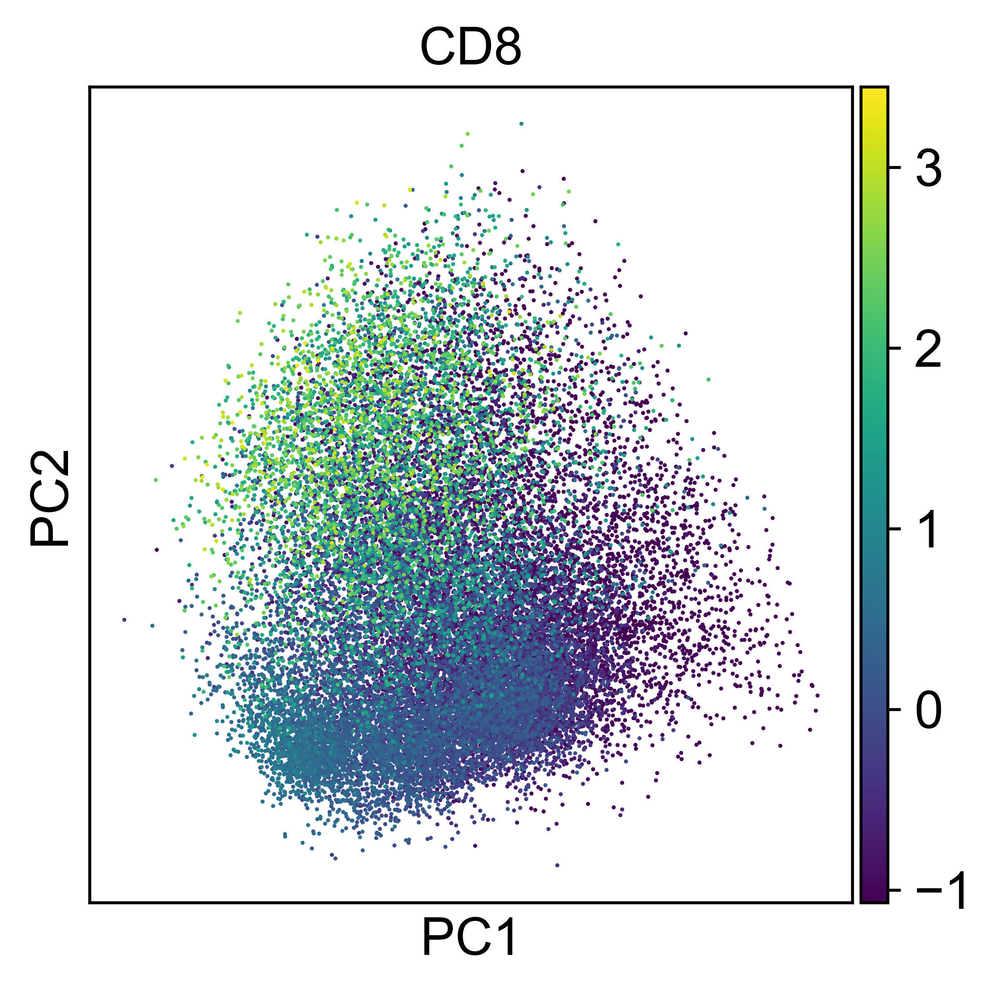

In [8]:
sc.tl.pca(adata, svd_solver='arpack') # peform PCA
sc.pl.pca(adata, color='CD8') # scatter plot in the PCA coordinates

In [9]:
##This is for batch correction - Remove # if you want to use this
#sc.external.pp.bbknn(adata, batch_key='batch')

In [10]:
adata.obs

,fov,roi,X,Y
0,2023-07-18-KK-BC25_21_1_FOV1,BC25_21_1_FOV1,2.733333,818.466667
1,2023-07-18-KK-BC25_21_1_FOV1,BC25_21_1_FOV1,2.261538,920.184615
2,2023-07-18-KK-BC25_21_1_FOV1,BC25_21_1_FOV1,3.295082,937.180328
3,2023-07-18-KK-BC25_21_1_FOV1,BC25_21_1_FOV1,3.879518,396.066265
4,2023-07-18-KK-BC25_21_1_FOV1,BC25_21_1_FOV1,4.360360,454.324324
...,...,...,...,...
24994,2023-07-18-KK-BC25_21_1_FOV6,BC25_21_1_FOV6,2043.433566,1688.000000
24995,2023-07-18-KK-BC25_21_1_FOV6,BC25_21_1_FOV6,2043.522059,2038.250000
24996,2023-07-18-KK-BC25_21_1_FOV6,BC25_21_1_FOV6,2044.719298,370.807018
24997,2023-07-18-KK-BC25_21_1_FOV6,BC25_21_1_FOV6,2044.833333,419.696970


In [11]:
data = pd.DataFrame(adata.X,columns=adata.var_names)

In [12]:
#Check the anndata- scyan scaled version
pd.DataFrame(adata.X).describe()

,0,1,2,3,4,5,6,7,8,9,...,27,28,29,30,31,32,33,34,35,36
count,2.499900e+04,2.499900e+04,2.499900e+04,2.499900e+04,2.499900e+04,2.499900e+04,2.499900e+04,2.499900e+04,2.499900e+04,2.499900e+04,...,2.499900e+04,2.499900e+04,2.499900e+04,2.499900e+04,2.499900e+04,2.499900e+04,2.499900e+04,2.499900e+04,2.499900e+04,2.499900e+04
mean,1.614759e-14,2.912716e-14,1.227299e-15,7.990231e-15,1.331042e-14,-5.562351e-15,7.105712e-15,-5.212750e-15,-3.112870e-15,1.113721e-14,...,-4.534012e-15,-5.673200e-16,7.563888e-15,9.952118e-15,-1.905468e-15,-2.731890e-14,8.590521e-15,-1.925932e-15,2.285623e-15,-7.964650e-15
std,1.000020e+00,1.000020e+00,1.000020e+00,1.000020e+00,1.000020e+00,1.000020e+00,1.000020e+00,1.000020e+00,1.000020e+00,1.000020e+00,...,1.000020e+00,1.000020e+00,1.000020e+00,1.000020e+00,1.000020e+00,1.000020e+00,1.000020e+00,1.000020e+00,1.000020e+00,1.000020e+00
min,-2.769777e+00,-2.472632e+00,-1.020916e+00,-1.676903e+00,-2.426672e+00,-1.020864e+00,-1.408855e+00,-1.356365e+00,-1.436309e+00,-1.552274e+00,...,-4.422287e+00,-1.727745e+00,-1.526521e+00,-1.234876e+00,-1.429141e+00,-4.444758e+00,-1.592150e+00,-1.020054e+00,-2.227250e+00,-1.180850e+00
25%,-6.226471e-01,-5.642852e-01,-9.303283e-01,-6.859145e-01,-5.406979e-01,-9.358384e-01,-7.349162e-01,-9.236339e-01,-8.001529e-01,-7.051908e-01,...,-7.099667e-01,-7.101346e-01,-6.810392e-01,-9.041990e-01,-8.794000e-01,-6.056693e-01,-8.307751e-01,-1.020054e+00,-6.397961e-01,-1.028515e+00
50%,1.775515e-02,1.663527e-01,-2.310366e-01,-2.204035e-02,1.099710e-01,-1.688887e-01,-3.376198e-02,4.586876e-03,-4.515690e-02,-1.836174e-01,...,3.214224e-02,5.649591e-02,-1.582202e-01,-6.830768e-02,2.075706e-02,1.032621e-01,-9.265529e-03,-1.921595e-01,5.359614e-02,-8.812898e-02
75%,7.285005e-01,7.497194e-01,5.986014e-01,6.712339e-01,7.555022e-01,6.044789e-01,5.676981e-01,7.420635e-01,6.639820e-01,5.768221e-01,...,7.770846e-01,6.947027e-01,5.190649e-01,6.549397e-01,7.364262e-01,7.563361e-01,8.508928e-01,8.164655e-01,7.614182e-01,7.987289e-01
max,2.658503e+00,2.515734e+00,3.774972e+00,3.369932e+00,2.245539e+00,6.096530e+00,4.201070e+00,5.216133e+00,3.667039e+00,3.608762e+00,...,2.489223e+00,5.257952e+00,4.183239e+00,5.162989e+00,4.553776e+00,2.399564e+00,2.852491e+00,2.684682e+00,2.941277e+00,4.119262e+00


Now you should modify your scyan table for clustering. An example link:
    
    https://docs.google.com/spreadsheets/d/1T4XTKp7n0C-ZtitHTYaQgc8z4y3mGFGR/edit#gid=81068921

In [13]:
#Importing the model for scyan with relevant cell populations and lineage markers
#Check https://mics-lab.github.io/scyan/advice/ for advice about constructing such cell tables
#Hierarchical cell populations can also be included 
#https://mics-lab.github.io/scyan/tutorials/usage/#working-with-hierarchical-populations

table = pd.read_excel(os.path.join(cell_table_dir,'table_scyan.xlsx'),index_col=[0, 1,2,3])

In [14]:
table

,,,,CD4,CD8,CD3,FOXP3,SMA,CD45,CD68,CD163,CAV,PanCK,CD56,CD11c,CD21,CD138,CD20,HLADR
Population,Level_3,Level_2,Level_1,,,,,,,,,,,,,,,,
CD8,T cells,Lymphoid,Immune,-1.0,1.0,1.0,-1,-1.0,NaN,-1,-1.0,-1,NaN,-1,-1,-1.0,-1.0,-1.0,-1.0
CD4,T cells,Lymphoid,Immune,1.0,-1.0,1.0,-1,-1.0,NaN,-1,-1.0,-1,NaN,-1,-1,-1.0,-1.0,-1.0,-1.0
Treg,T cells,Lymphoid,Immune,1.0,-1.0,1.0,1,-1.0,NaN,-1,-1.0,-1,NaN,-1,-1,-1.0,-1.0,-1.0,-1.0
B cells,B cells,Lymphoid,Immune,NaN,-1.0,-1.0,-1,-1.0,NaN,-1,-1.0,-1,NaN,-1,-1,NaN,-1.0,1.0,NaN
CD21+ B cells,B cells,Lymphoid,Immune,NaN,-1.0,-1.0,-1,-1.0,NaN,-1,-1.0,-1,NaN,-1,-1,1.0,-1.0,1.0,NaN
Plasma cells,B cells,Lymphoid,Immune,NaN,-1.0,-1.0,-1,-1.0,1.0,-1,-1.0,-1,NaN,-1,-1,NaN,1.0,NaN,NaN
NK cells,All NK cells,Lymphoid,Immune,NaN,-1.0,-1.0,-1,-1.0,NaN,-1,-1.0,-1,NaN,1,-1,-1.0,-1.0,-1.0,-1.0
Macrophages,Mono/Mac,Myeloid,Immune,NaN,-1.0,-1.0,-1,-1.0,NaN,1,-1.0,-1,NaN,-1,-1,-1.0,-1.0,-1.0,-1.0
M2 like Macrophages,Mono/Mac,Myeloid,Immune,NaN,-1.0,-1.0,-1,-1.0,NaN,1,1.0,-1,NaN,-1,-1,-1.0,-1.0,-1.0,-1.0


In [15]:
#UMAP
#Use only the cell-type markers (recommended), or your choose your own list of markers
scyan.tools.umap(adata, markers=table.columns)

[INFO] (scyan.tools.representation) Fitting UMAP...


UMAP(min_dist=0.5, tqdm_kwds={'bar_format': '{desc}: {percentage:3.0f}%| {bar} {n_fmt}/{total_fmt} [{elapsed}]', 'desc': 'Epochs completed', 'disable': True})

KeyError: 'Could not find key batch in .var_names or .obs.columns.'

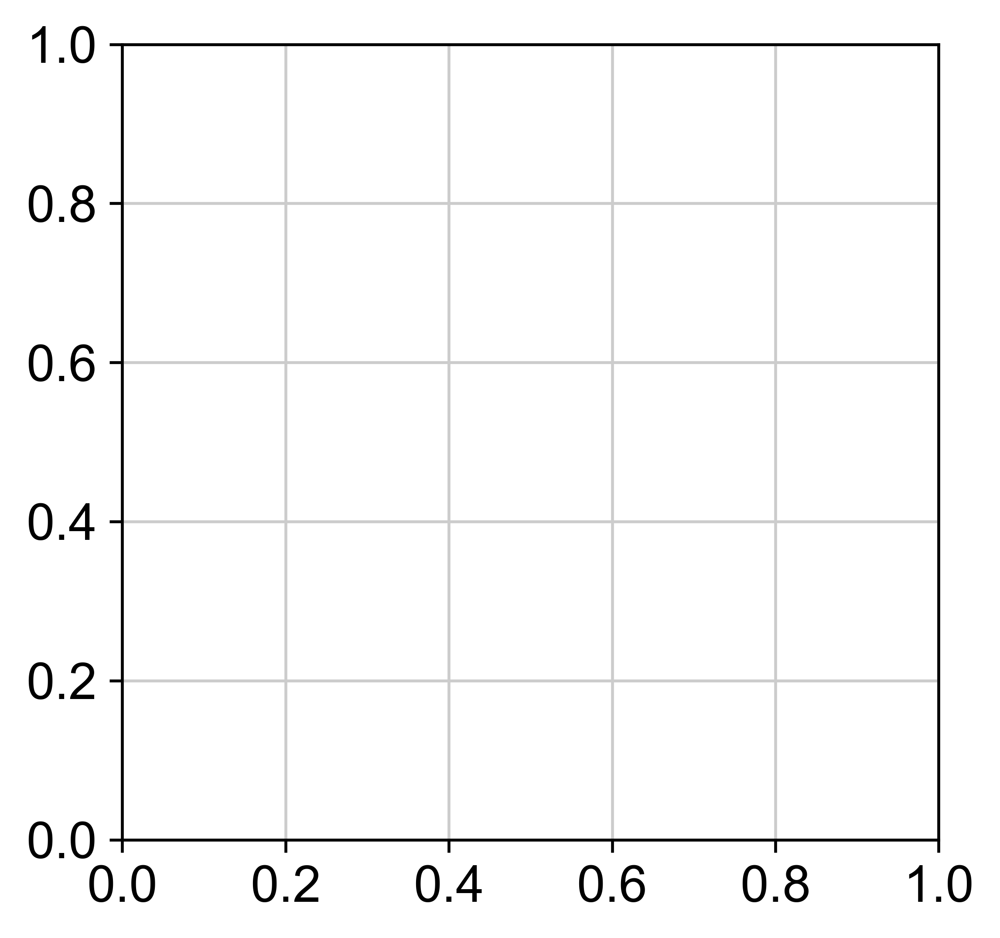

In [105]:
scyan.plot.umap(adata, color="batch")

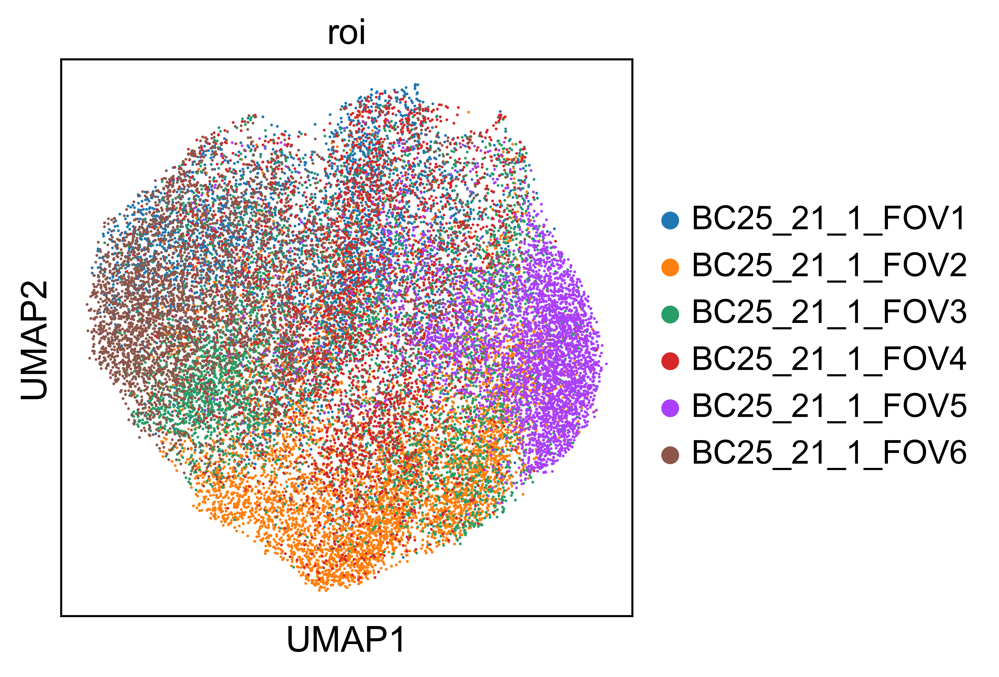

In [16]:
scyan.plot.umap(adata, color="roi")

In [17]:
# Change batch correction to True or False here
batch_effect_correction = False

if not batch_effect_correction:
    model = scyan.Scyan(adata,table,batch_size=5000, prior_std=0.3)
else:
    # When training for the first time on a new dataset, we advise to start with the default arguments (i.e., remove 'prior_std' and 'lr')
    # if there are batch effects, define them in the batch_key argument
    model = scyan.Scyan(adata,table, batch_key='fov',  batch_size = 20000)

# For better batch effect correction, we advise to increase the default 'patience' and decrease 'min_delta'
# NB: if you have less than 1 million cells, you can also increase 'max_epochs'
model.fit(patience=10, min_delta=0.1, max_epochs=250)

[INFO] (scyan.model) Initialized Scyan model with N=24999 cells, P=14 populations and M=16 markers.
   ├── No covariate provided
   ├── No continuum-marker provided
   └── Batch correction mode: False
[INFO] (scyan.model) Training scyan with the following hyperparameters:
"batch_key":       None
"batch_size":      5000
"hidden_size":     16
"lr":              0.0005
"max_samples":     200000
"modulo_temp":     3
"n_hidden_layers": 6
"n_layers":        7
"prior_std":       0.3
"temperature":     0.5

GPU available: False, used: False
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs

  | Name   | Type        | Params
---------------------------------------
0 | module | ScyanModule | 30.5 K
---------------------------------------
30.5 K    Trainable params
0         Non-trainable params
30.5 K    Total params
0.122     Total estimated model params size (MB)


Epoch 145: 100%|██████████| 4/4 [00:02<00:00,  1.97it/s, loss=24.9]

[INFO] (scyan.model) Successfully ended traning.


Scyan model with N=24999 cells, P=14 populations and M=16 markers.
   ├── No covariate provided
   ├── No continuum-marker provided
   └── Batch correction mode: False

In [18]:
model.predict()

DataLoader:   0%|          | 0/5 [00:00<?, ?it/s]

DataLoader: 100%|██████████| 5/5 [00:01<00:00,  3.85it/s]
[WARNING] (scyan.model) 2 population(s) were not predicted. It may be due to:
  - Errors in the knowledge table (see https://mics-lab.github.io/scyan/advice/#advice-for-the-creation-of-the-table)
  - The model hyperparameters choice (see https://mics-lab.github.io/scyan/advanced/parameters/)
  - Or maybe these populations are really absent from this dataset.


0                Macrophages
1           CAV+ Fibroblasts
2           CAV+ Fibroblasts
3                        CD4
4                        CD4
                ...         
24994                    CD4
24995       Epithelial cells
24996       CAV+ Fibroblasts
24997       CAV+ Fibroblasts
24998    M2 like Macrophages
Length: 24999, dtype: category
Categories (12, object): ['B cells', 'CAV+ Fibroblasts', 'CD4', 'CD8', ..., 'Myofibroblasts', 'NK cells', 'Other APCs', 'Treg']

In [19]:
print(adata.obs["scyan_pop"].unique())

['Macrophages', 'CAV+ Fibroblasts', 'CD4', 'Epithelial cells', 'Myofibroblasts', ..., 'Dendritic cells', 'NK cells', 'Other APCs', 'B cells', NaN]
Length: 13
Categories (14, object): ['CD8', 'CD4', 'Treg', 'B cells', ..., 'Other APCs', 'Epithelial cells', 'Myofibroblasts', 'CAV+ Fibroblasts']


In [20]:
model.predict_proba()

DataLoader: 100%|██████████| 5/5 [00:01<00:00,  3.80it/s]


Population,CD8,CD4,Treg,B cells,CD21+ B cells,Plasma cells,NK cells,Macrophages,M2 like Macrophages,Dendritic cells,Other APCs,Epithelial cells,Myofibroblasts,CAV+ Fibroblasts,max_log_prob,max_log_prob_u
0,2.812391e-37,1.510680e-37,0.000000e+00,2.719446e-28,2.761204e-38,3.138382e-37,6.410620e-30,1.000000e+00,3.728663e-11,8.549938e-29,4.762409e-21,4.923642e-28,3.111049e-23,6.283694e-25,-10.920929,-8.952238
1,2.104703e-24,3.359172e-19,8.291033e-35,1.358405e-25,4.629139e-39,1.176478e-22,1.710185e-08,2.254784e-13,6.484050e-25,1.659557e-13,1.049779e-24,2.889249e-16,2.201248e-15,1.000000e+00,-16.887383,-14.838666
2,4.542254e-31,1.773341e-28,4.175869e-43,5.977791e-31,1.021876e-38,9.033944e-37,2.198515e-27,1.004269e-25,3.294723e-37,5.691336e-30,6.944299e-27,7.930734e-26,1.873527e-23,1.000000e+00,-4.325855,-2.277138
3,6.346000e-21,9.999579e-01,4.205532e-05,1.267600e-22,8.751430e-28,5.131407e-22,1.090119e-17,9.917834e-22,7.333548e-35,1.074948e-24,1.954773e-20,1.936244e-17,1.329322e-27,3.624110e-23,-7.859442,-6.126416
4,2.116118e-17,1.000000e+00,2.429250e-12,6.976970e-24,2.044048e-36,6.714944e-14,3.629988e-17,4.400920e-11,1.383055e-23,4.045331e-16,7.194374e-18,1.487938e-17,1.395088e-17,5.039625e-24,-10.522923,-8.789896
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
24994,1.016224e-13,9.999970e-01,3.095426e-11,2.250588e-06,4.815566e-17,8.313000e-17,4.483745e-15,1.382607e-16,6.209941e-27,1.160752e-10,6.802063e-07,6.241356e-21,2.310650e-23,2.354742e-22,-14.769178,-13.036152
24995,4.637157e-13,8.640686e-18,8.275487e-29,8.665068e-13,2.466853e-23,3.921772e-15,1.459360e-10,3.512847e-11,1.117776e-22,1.386159e-12,1.326160e-04,9.998673e-01,1.179974e-10,4.150887e-14,-11.454171,-10.620439
24996,5.324934e-44,4.032068e-30,4.466345e-38,9.956789e-25,6.381760e-36,2.389253e-35,2.132315e-25,9.192899e-19,8.697493e-33,4.928944e-12,2.190004e-18,2.001647e-21,2.051033e-19,1.000000e+00,-17.587616,-15.538899
24997,5.428699e-02,3.449179e-16,3.590222e-30,3.263195e-12,1.698903e-25,6.887668e-25,3.029621e-14,6.431376e-13,7.077096e-23,1.659863e-04,3.566232e-19,1.625663e-09,4.354378e-20,9.455470e-01,-36.789963,-34.741245


In [21]:
adata.obs

,fov,roi,X,Y,scyan_pop,scyan_pop_Level_3,scyan_pop_Level_2,scyan_pop_Level_1
0,2023-07-18-KK-BC25_21_1_FOV1,BC25_21_1_FOV1,2.733333,818.466667,Macrophages,Mono/Mac,Myeloid,Immune
1,2023-07-18-KK-BC25_21_1_FOV1,BC25_21_1_FOV1,2.261538,920.184615,CAV+ Fibroblasts,Fibroblasts,Stroma,Non-immune
2,2023-07-18-KK-BC25_21_1_FOV1,BC25_21_1_FOV1,3.295082,937.180328,CAV+ Fibroblasts,Fibroblasts,Stroma,Non-immune
3,2023-07-18-KK-BC25_21_1_FOV1,BC25_21_1_FOV1,3.879518,396.066265,CD4,T cells,Lymphoid,Immune
4,2023-07-18-KK-BC25_21_1_FOV1,BC25_21_1_FOV1,4.360360,454.324324,CD4,T cells,Lymphoid,Immune
...,...,...,...,...,...,...,...,...
24994,2023-07-18-KK-BC25_21_1_FOV6,BC25_21_1_FOV6,2043.433566,1688.000000,CD4,T cells,Lymphoid,Immune
24995,2023-07-18-KK-BC25_21_1_FOV6,BC25_21_1_FOV6,2043.522059,2038.250000,Epithelial cells,Epithelial cells,Epithelial,Non-immune
24996,2023-07-18-KK-BC25_21_1_FOV6,BC25_21_1_FOV6,2044.719298,370.807018,CAV+ Fibroblasts,Fibroblasts,Stroma,Non-immune
24997,2023-07-18-KK-BC25_21_1_FOV6,BC25_21_1_FOV6,2044.833333,419.696970,CAV+ Fibroblasts,Fibroblasts,Stroma,Non-immune


In [22]:
adata.obs['scyan_pop'] = adata.obs['scyan_pop'].astype("string")
adata.obs['scyan_pop'] = adata.obs['scyan_pop'].fillna('Unknown')

In [23]:
adata.obs['scyan_pop_Level_3'] = adata.obs['scyan_pop_Level_3'].astype("string")
adata.obs['scyan_pop_Level_3'] = adata.obs['scyan_pop_Level_3'].fillna('Unknown')

In [24]:
print(adata.obs)

                                fov             roi            X            Y  \
0      2023-07-18-KK-BC25_21_1_FOV1  BC25_21_1_FOV1     2.733333   818.466667   
1      2023-07-18-KK-BC25_21_1_FOV1  BC25_21_1_FOV1     2.261538   920.184615   
2      2023-07-18-KK-BC25_21_1_FOV1  BC25_21_1_FOV1     3.295082   937.180328   
3      2023-07-18-KK-BC25_21_1_FOV1  BC25_21_1_FOV1     3.879518   396.066265   
4      2023-07-18-KK-BC25_21_1_FOV1  BC25_21_1_FOV1     4.360360   454.324324   
...                             ...             ...          ...          ...   
24994  2023-07-18-KK-BC25_21_1_FOV6  BC25_21_1_FOV6  2043.433566  1688.000000   
24995  2023-07-18-KK-BC25_21_1_FOV6  BC25_21_1_FOV6  2043.522059  2038.250000   
24996  2023-07-18-KK-BC25_21_1_FOV6  BC25_21_1_FOV6  2044.719298   370.807018   
24997  2023-07-18-KK-BC25_21_1_FOV6  BC25_21_1_FOV6  2044.833333   419.696970   
24998  2023-07-18-KK-BC25_21_1_FOV6  BC25_21_1_FOV6  2044.040984  1198.704918   

                 scyan_pop 

In [25]:
## Try the following code to see the datatype, might be a problem with writing/reading the datatypes
adata.obs.dtypes

fov                  category
roi                  category
X                     float64
Y                     float64
scyan_pop              string
scyan_pop_Level_3      string
scyan_pop_Level_2    category
scyan_pop_Level_1    category
dtype: object

In [26]:
print(adata.obs)

                                fov             roi            X            Y  \
0      2023-07-18-KK-BC25_21_1_FOV1  BC25_21_1_FOV1     2.733333   818.466667   
1      2023-07-18-KK-BC25_21_1_FOV1  BC25_21_1_FOV1     2.261538   920.184615   
2      2023-07-18-KK-BC25_21_1_FOV1  BC25_21_1_FOV1     3.295082   937.180328   
3      2023-07-18-KK-BC25_21_1_FOV1  BC25_21_1_FOV1     3.879518   396.066265   
4      2023-07-18-KK-BC25_21_1_FOV1  BC25_21_1_FOV1     4.360360   454.324324   
...                             ...             ...          ...          ...   
24994  2023-07-18-KK-BC25_21_1_FOV6  BC25_21_1_FOV6  2043.433566  1688.000000   
24995  2023-07-18-KK-BC25_21_1_FOV6  BC25_21_1_FOV6  2043.522059  2038.250000   
24996  2023-07-18-KK-BC25_21_1_FOV6  BC25_21_1_FOV6  2044.719298   370.807018   
24997  2023-07-18-KK-BC25_21_1_FOV6  BC25_21_1_FOV6  2044.833333   419.696970   
24998  2023-07-18-KK-BC25_21_1_FOV6  BC25_21_1_FOV6  2044.040984  1198.704918   

                 scyan_pop 

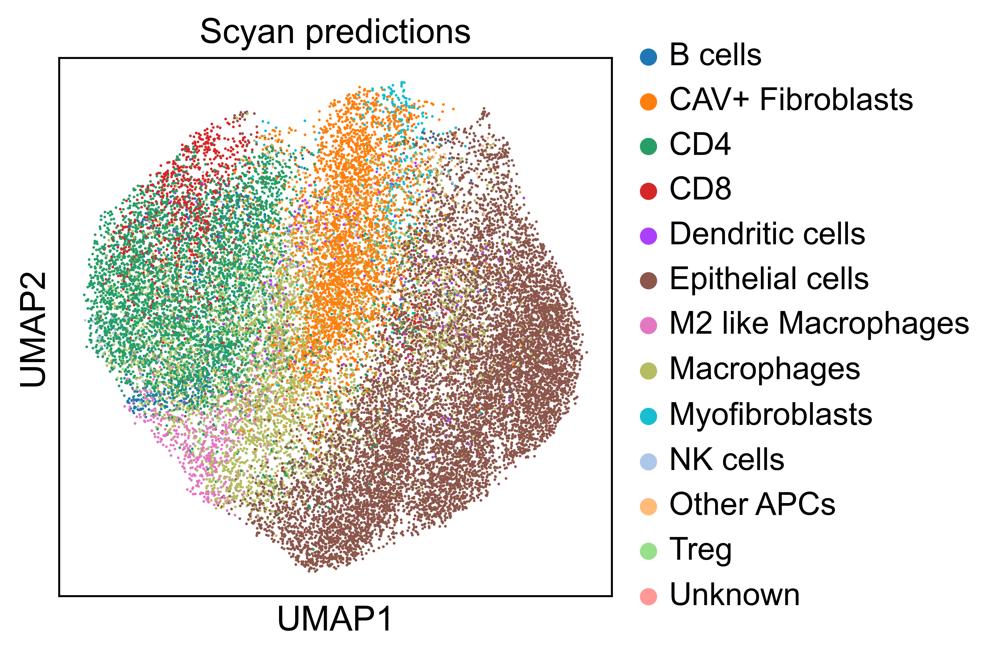

In [27]:
palette = scyan.tools.palette_level(table)
palette["Unknown"] = "#bbb" # Only if you renamed the np.nan cells as "Unknown"

scyan.plot.umap(adata, color="scyan_pop", title="Scyan predictions")

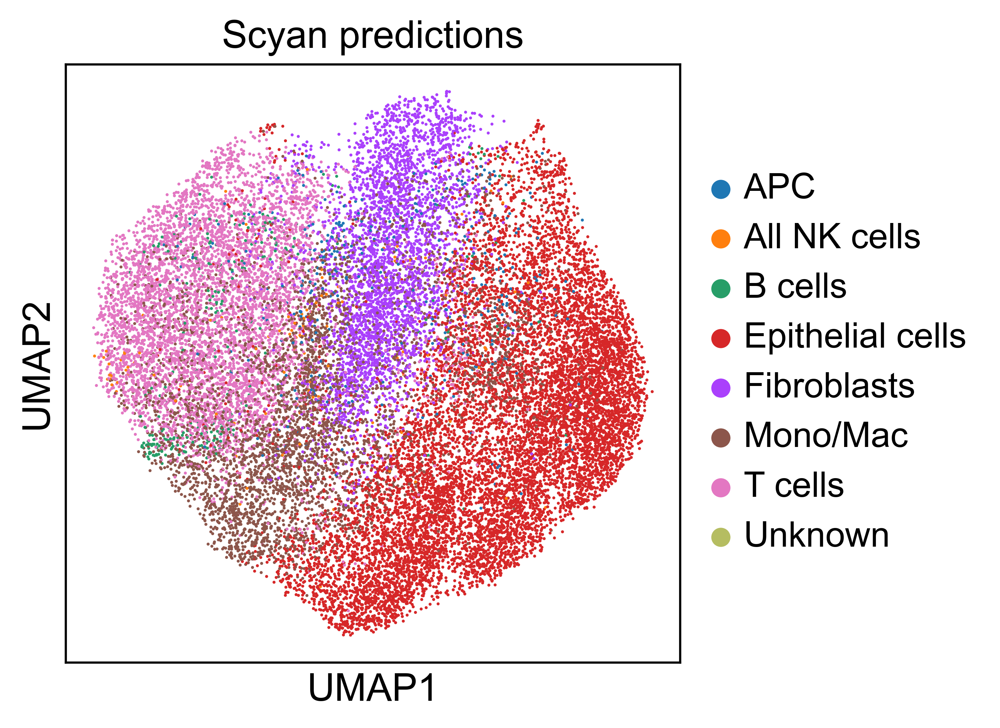

In [28]:
palette = scyan.tools.palette_level(table)
palette["Unknown"] = "#bbb" # Only if you renamed the np.nan cells as "Unknown"

scyan.plot.umap(adata, color="scyan_pop_Level_3", title="Scyan predictions")

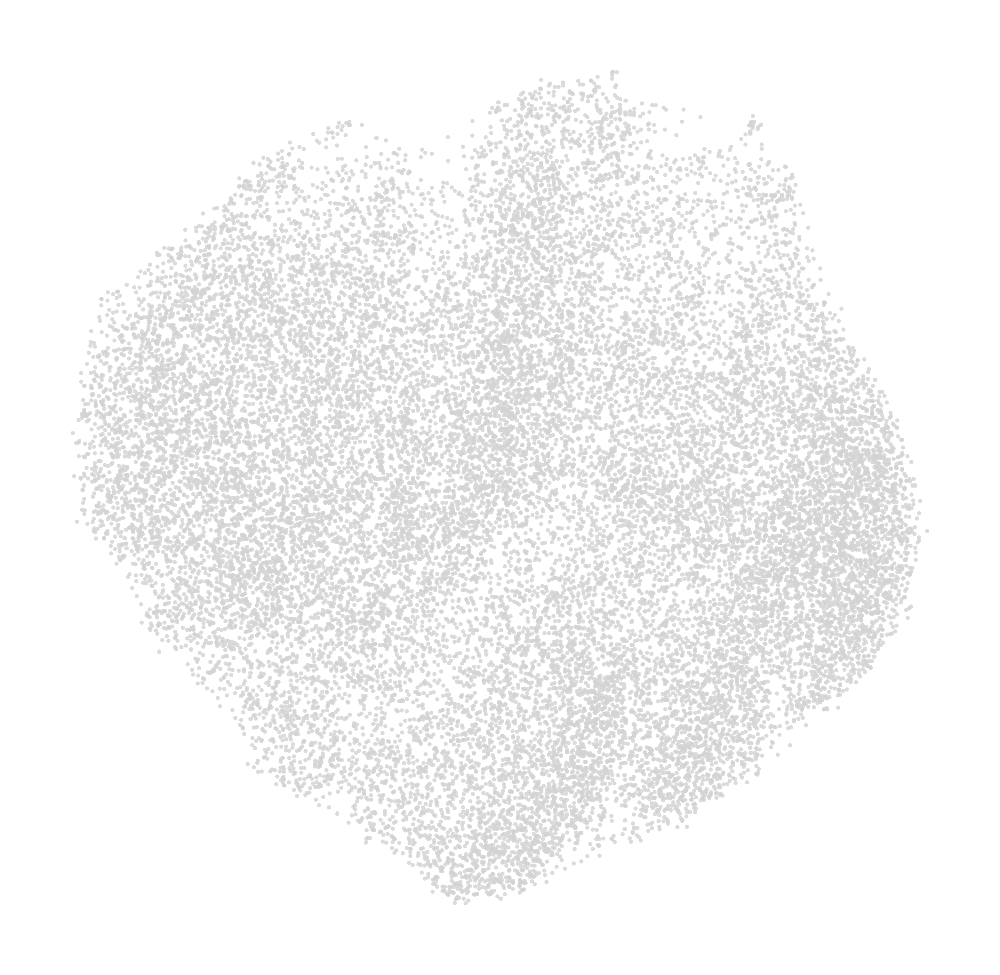

In [29]:
# Specify the cluster of interest
specific_cluster = 'Plasma cells'
# Assign colors to cells in the cluster of interest and set other cells to gray
adata.obs['color'] = np.where(adata.obs['scyan_pop'] == specific_cluster, 'red', 'lightgray')
# Plot the UMAP with the specific cluster highlighted
plt.scatter(adata.obsm['X_umap'][:, 0], adata.obsm['X_umap'][:, 1],
            color=adata.obs['color'], s=1, alpha=0.8, edgecolor='none')
plt.axis('off')
plt.show()

In [147]:
#Identifying marker genes for each population
sc.tl.rank_genes_groups(adata, 'scyan_pop', method='t-test')
sc.pl.rank_genes_groups(adata, n_genes=10, sharey=False, save= "highest_ranked_markers_mesmerv2.png")

ranking genes


ValueError: Could not calculate statistics for groups Unknown since they only contain one sample.

ranking genes


    finished: added to `.uns['rank_genes_groups']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
    'logfoldchanges', sorted np.recarray to be indexed by group ids
    'pvals', sorted np.recarray to be indexed by group ids
    'pvals_adj', sorted np.recarray to be indexed by group ids (0:00:00)


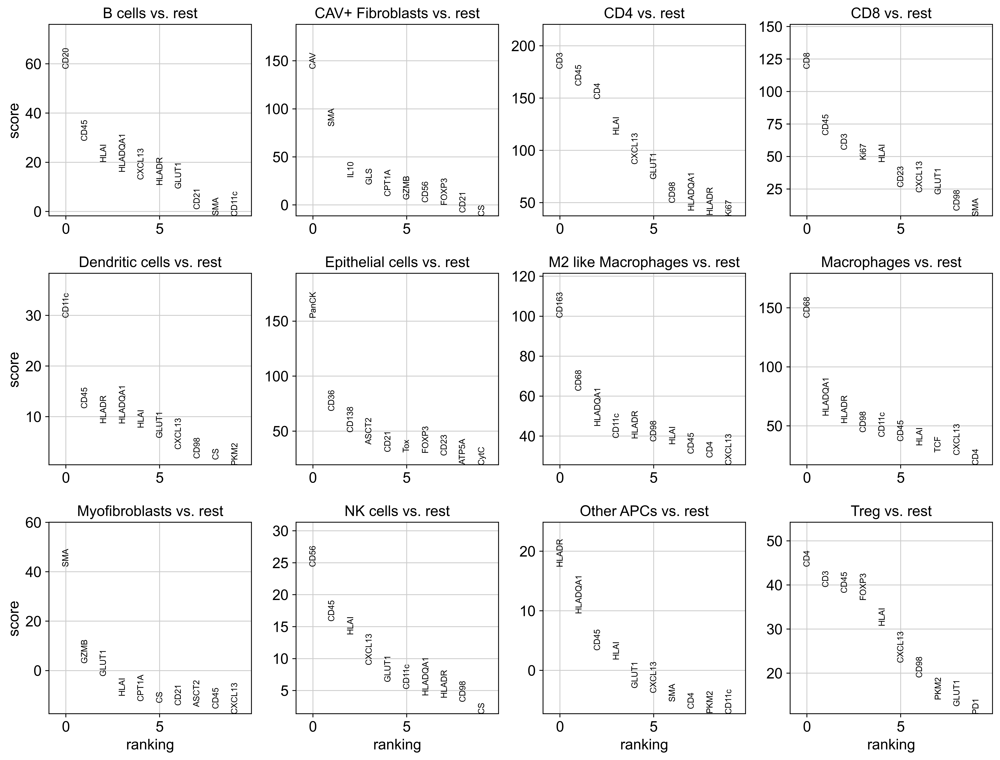

In [30]:
# Exclude the 'Unknown' group from the analysis
groups_to_include = [group for group in adata.obs['scyan_pop'].cat.categories if group != 'Unknown']

# Perform rank_genes_groups analysis
sc.tl.rank_genes_groups(adata, 'scyan_pop', groups=groups_to_include, method='t-test')

# Plot the ranked genes
sc.pl.rank_genes_groups(adata, n_genes=10, sharey=False, save="highest_ranked_markers_mesmerv2.png")

In [31]:
# compute hierarchical clustering using PCs (several distance metrics and linkage methods are available).
sc.tl.dendrogram(adata, 'scyan_pop')

    using data matrix X directly
Storing dendrogram info using `.uns['dendrogram_scyan_pop']`


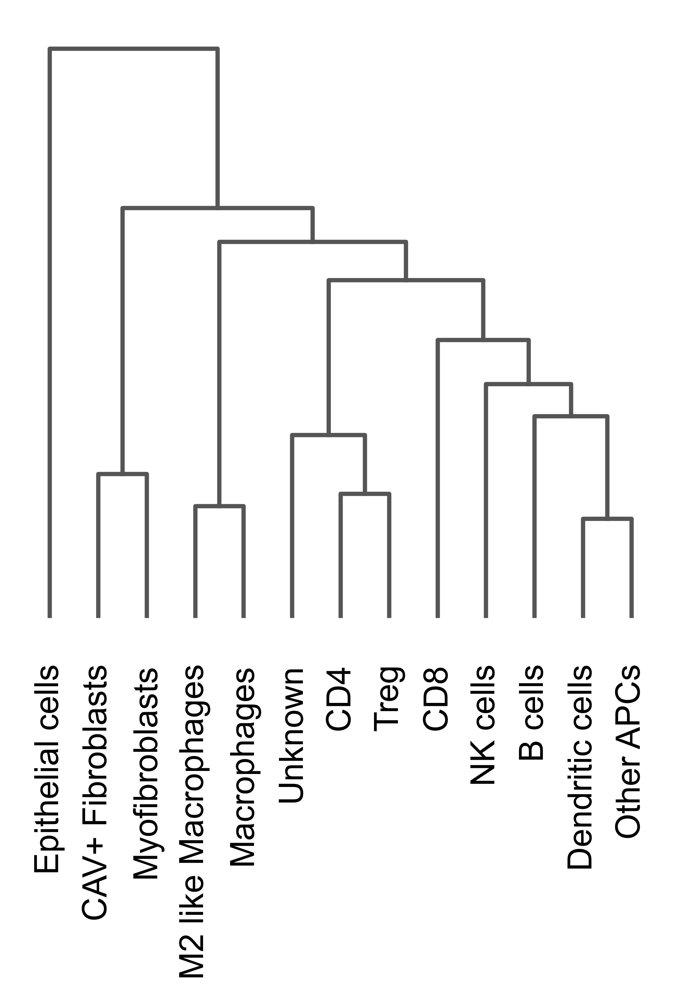

<Axes: >

In [32]:
sc.pl.dendrogram(adata, 'scyan_pop')

    using data matrix X directly
Storing dendrogram info using `.uns['dendrogram_scyan_pop_Level_3']`


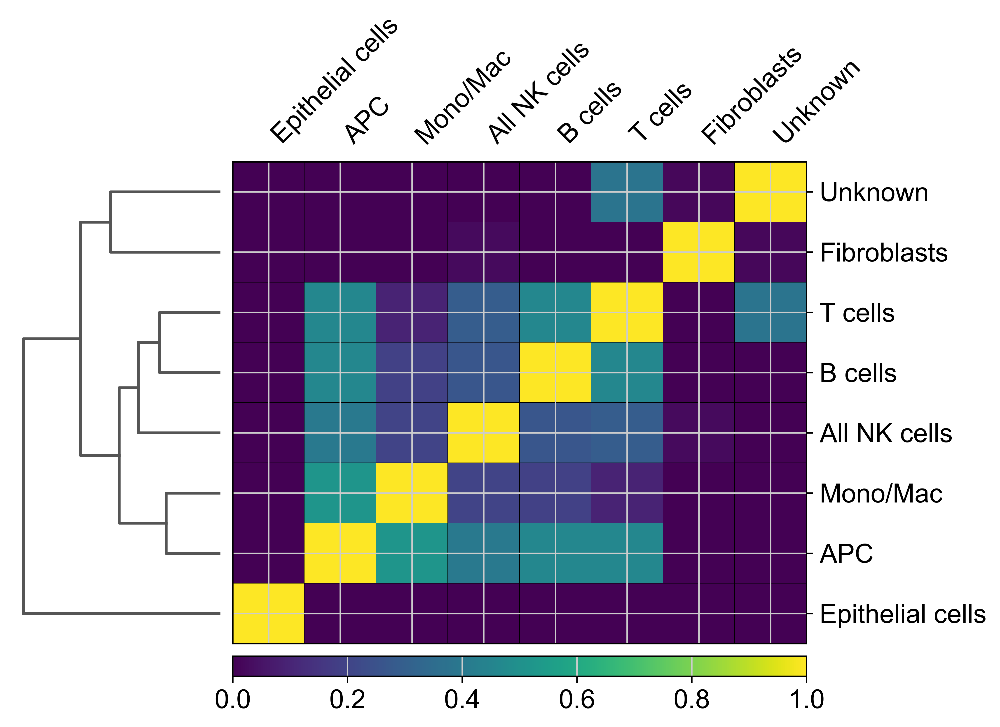

In [33]:
cmap = 'viridis'
sc.pl.correlation_matrix(adata, 'scyan_pop_Level_3', cmap=cmap, vmin=0, vmax=1, figsize=(7.5,5), save="Correlation_matrix_pop_level3_mesmerv2_filtered.png" )


## Saving cluster iniformation with MIBI data for inspection Mantis viewer

In [34]:
os.getcwd()

'C:\\Users\\Peter\\Documents\\Internship_DKFZ\\Visual_coding_studio\\ark-analysis-0.6.3\\data\\output\\2023-07-18-KK-BC25_21_1_KK003'

In [35]:
clusters = adata.obs.drop(axis=1, columns=['fov', 'roi', 'X', 'Y'])

df = pd.read_csv(os.path.join(cell_table_dir,'cell_table_size_normalized_mesmerv2_filtered_preprocessed.csv'))


print(df)

       cell_size     ASCT2     ATP5A       CAV     CD11c     CD138     CD163  \
0          120.0  0.040821  0.000000  0.288043  0.170178  0.000000  0.000000   
1           65.0  0.799789  0.434090  0.611390  0.390329  0.659535  0.000000   
2           61.0  0.463938  0.055665  0.765521  0.000000  0.350014  0.000000   
3          166.0  0.442477  0.531738  0.253565  0.151395  0.472460  0.000000   
4          111.0  0.381852  0.804111  0.000000  0.431157  0.914409  0.000000   
...          ...       ...       ...       ...       ...       ...       ...   
24994      143.0  0.275791  0.000000  0.000000  0.435577  0.079685  0.000000   
24995      136.0  0.683072  0.006205  0.051145  0.009625  0.195570  0.000000   
24996       57.0  0.277131  0.741102  0.860181  0.536623  0.099907  0.000000   
24997       66.0  0.000000  0.000000  0.691311  0.583682  0.000000  0.000000   
24998      122.0  0.165361  0.419830  0.000000  0.726106  0.548513  0.681733   

           CD20      CD21      CD23  ..

In [36]:
print(clusters)

                 scyan_pop scyan_pop_Level_3 scyan_pop_Level_2  \
0              Macrophages          Mono/Mac           Myeloid   
1         CAV+ Fibroblasts       Fibroblasts            Stroma   
2         CAV+ Fibroblasts       Fibroblasts            Stroma   
3                      CD4           T cells          Lymphoid   
4                      CD4           T cells          Lymphoid   
...                    ...               ...               ...   
24994                  CD4           T cells          Lymphoid   
24995     Epithelial cells  Epithelial cells        Epithelial   
24996     CAV+ Fibroblasts       Fibroblasts            Stroma   
24997     CAV+ Fibroblasts       Fibroblasts            Stroma   
24998  M2 like Macrophages          Mono/Mac           Myeloid   

      scyan_pop_Level_1      color  
0               Immune   lightgray  
1            Non-immune  lightgray  
2            Non-immune  lightgray  
3               Immune   lightgray  
4               Immune

In [37]:
df.columns

Index(['cell_size', 'ASCT2', 'ATP5A', 'CAV', 'CD11c', 'CD138', 'CD163', 'CD20',
       'CD21', 'CD23', 'CD3', 'CD36', 'CD4', 'CD45', 'CD56', 'CD68', 'CD8',
       'CD98', 'CPT1A', 'CS', 'CXCL13', 'CytC', 'FOXP3', 'GLS', 'GLUT1',
       'GZMB', 'HLADQA1', 'HLADR', 'HLAI', 'IL10', 'Ki67', 'PD1', 'PDL1',
       'PKM2', 'PanCK', 'SMA', 'TCF', 'Tox', 'label', 'area', 'eccentricity',
       'major_axis_length', 'minor_axis_length', 'perimeter', 'convex_area',
       'equivalent_diameter', 'X', 'Y', 'major_minor_axis_ratio',
       'perim_square_over_area', 'major_axis_equiv_diam_ratio',
       'convex_hull_resid', 'centroid_dif', 'num_concavities', 'fov', 'roi'],
      dtype='object')

In [38]:
df_updated = df.join(clusters.reset_index(drop=True))

### Save updated dataframe

This is the dataframe we are going to use for any further analysis too!

In [48]:
df_updated.to_csv(os.path.join(cell_table_dir,'2023-07-18-KK-BC25_21_1_cell_table_clustered_mesmerv2.csv'))

In [40]:
print(df_updated.columns)
df_updated.head

Index(['cell_size', 'ASCT2', 'ATP5A', 'CAV', 'CD11c', 'CD138', 'CD163', 'CD20',
       'CD21', 'CD23', 'CD3', 'CD36', 'CD4', 'CD45', 'CD56', 'CD68', 'CD8',
       'CD98', 'CPT1A', 'CS', 'CXCL13', 'CytC', 'FOXP3', 'GLS', 'GLUT1',
       'GZMB', 'HLADQA1', 'HLADR', 'HLAI', 'IL10', 'Ki67', 'PD1', 'PDL1',
       'PKM2', 'PanCK', 'SMA', 'TCF', 'Tox', 'label', 'area', 'eccentricity',
       'major_axis_length', 'minor_axis_length', 'perimeter', 'convex_area',
       'equivalent_diameter', 'X', 'Y', 'major_minor_axis_ratio',
       'perim_square_over_area', 'major_axis_equiv_diam_ratio',
       'convex_hull_resid', 'centroid_dif', 'num_concavities', 'fov', 'roi',
       'scyan_pop', 'scyan_pop_Level_3', 'scyan_pop_Level_2',
       'scyan_pop_Level_1', 'color'],
      dtype='object')


<bound method NDFrame.head of        cell_size     ASCT2     ATP5A       CAV     CD11c     CD138     CD163  \
0          120.0  0.040821  0.000000  0.288043  0.170178  0.000000  0.000000   
1           65.0  0.799789  0.434090  0.611390  0.390329  0.659535  0.000000   
2           61.0  0.463938  0.055665  0.765521  0.000000  0.350014  0.000000   
3          166.0  0.442477  0.531738  0.253565  0.151395  0.472460  0.000000   
4          111.0  0.381852  0.804111  0.000000  0.431157  0.914409  0.000000   
...          ...       ...       ...       ...       ...       ...       ...   
24994      143.0  0.275791  0.000000  0.000000  0.435577  0.079685  0.000000   
24995      136.0  0.683072  0.006205  0.051145  0.009625  0.195570  0.000000   
24996       57.0  0.277131  0.741102  0.860181  0.536623  0.099907  0.000000   
24997       66.0  0.000000  0.000000  0.691311  0.583682  0.000000  0.000000   
24998      122.0  0.165361  0.419830  0.000000  0.726106  0.548513  0.681733   

         

In [41]:
clusters.head()

,scyan_pop,scyan_pop_Level_3,scyan_pop_Level_2,scyan_pop_Level_1,color
0,Macrophages,Mono/Mac,Myeloid,Immune,lightgray
1,CAV+ Fibroblasts,Fibroblasts,Stroma,Non-immune,lightgray
2,CAV+ Fibroblasts,Fibroblasts,Stroma,Non-immune,lightgray
3,CD4,T cells,Lymphoid,Immune,lightgray
4,CD4,T cells,Lymphoid,Immune,lightgray


In [42]:
df_updated.head()

,cell_size,ASCT2,ATP5A,CAV,CD11c,CD138,CD163,CD20,CD21,CD23,...,convex_hull_resid,centroid_dif,num_concavities,fov,roi,scyan_pop,scyan_pop_Level_3,scyan_pop_Level_2,scyan_pop_Level_1,color
0,120.0,0.040821,0.000000,0.288043,0.170178,0.000000,0.0,0.000000,0.000000,0.000000,...,0.062500,0.020808,0.0,2023-07-18-KK-BC25_21_1_FOV1,BC25_21_1_FOV1,Macrophages,Mono/Mac,Myeloid,Immune,lightgray
1,65.0,0.799789,0.434090,0.611390,0.390329,0.659535,0.0,0.055256,0.000000,0.397882,...,0.029851,0.016378,0.0,2023-07-18-KK-BC25_21_1_FOV1,BC25_21_1_FOV1,CAV+ Fibroblasts,Fibroblasts,Stroma,Non-immune,lightgray
2,61.0,0.463938,0.055665,0.765521,0.000000,0.350014,0.0,0.000000,0.496780,0.045169,...,0.061538,0.015469,0.0,2023-07-18-KK-BC25_21_1_FOV1,BC25_21_1_FOV1,CAV+ Fibroblasts,Fibroblasts,Stroma,Non-immune,lightgray
3,166.0,0.442477,0.531738,0.253565,0.151395,0.472460,0.0,0.184816,0.465811,0.198809,...,0.045977,0.013903,0.0,2023-07-18-KK-BC25_21_1_FOV1,BC25_21_1_FOV1,CD4,T cells,Lymphoid,Immune,lightgray
4,111.0,0.381852,0.804111,0.000000,0.431157,0.914409,0.0,0.000000,0.057484,0.033993,...,0.067227,0.017323,0.0,2023-07-18-KK-BC25_21_1_FOV1,BC25_21_1_FOV1,CD4,T cells,Lymphoid,Immune,lightgray


In [43]:
df_updated.drop(columns=df_updated.columns[0], axis=1, inplace=True)
df_updated.head()

,ASCT2,ATP5A,CAV,CD11c,CD138,CD163,CD20,CD21,CD23,CD3,...,convex_hull_resid,centroid_dif,num_concavities,fov,roi,scyan_pop,scyan_pop_Level_3,scyan_pop_Level_2,scyan_pop_Level_1,color
0,0.040821,0.000000,0.288043,0.170178,0.000000,0.0,0.000000,0.000000,0.000000,0.011179,...,0.062500,0.020808,0.0,2023-07-18-KK-BC25_21_1_FOV1,BC25_21_1_FOV1,Macrophages,Mono/Mac,Myeloid,Immune,lightgray
1,0.799789,0.434090,0.611390,0.390329,0.659535,0.0,0.055256,0.000000,0.397882,0.278186,...,0.029851,0.016378,0.0,2023-07-18-KK-BC25_21_1_FOV1,BC25_21_1_FOV1,CAV+ Fibroblasts,Fibroblasts,Stroma,Non-immune,lightgray
2,0.463938,0.055665,0.765521,0.000000,0.350014,0.0,0.000000,0.496780,0.045169,0.267796,...,0.061538,0.015469,0.0,2023-07-18-KK-BC25_21_1_FOV1,BC25_21_1_FOV1,CAV+ Fibroblasts,Fibroblasts,Stroma,Non-immune,lightgray
3,0.442477,0.531738,0.253565,0.151395,0.472460,0.0,0.184816,0.465811,0.198809,0.690765,...,0.045977,0.013903,0.0,2023-07-18-KK-BC25_21_1_FOV1,BC25_21_1_FOV1,CD4,T cells,Lymphoid,Immune,lightgray
4,0.381852,0.804111,0.000000,0.431157,0.914409,0.0,0.000000,0.057484,0.033993,0.671447,...,0.067227,0.017323,0.0,2023-07-18-KK-BC25_21_1_FOV1,BC25_21_1_FOV1,CD4,T cells,Lymphoid,Immune,lightgray


In [44]:
# Using a dict-comprehension, the unique 'method' value will be the key
clusters_per_fov = {g: d for g, d in df_updated.groupby('fov')}

In [45]:
clusters_per_fov.keys()

dict_keys(['2023-07-18-KK-BC25_21_1_FOV1', '2023-07-18-KK-BC25_21_1_FOV2', '2023-07-18-KK-BC25_21_1_FOV3', '2023-07-18-KK-BC25_21_1_FOV4', '2023-07-18-KK-BC25_21_1_FOV5', '2023-07-18-KK-BC25_21_1_FOV6'])

In [49]:
one_fov = clusters_per_fov['2023-07-18-KK-BC25_21_1_FOV1']
one_fov = one_fov[['label','scyan_pop']]
one_fov.to_csv(os.path.join(cell_table_dir,'2023-07-18-KK-BC25_21_1_FOV1_clustered_mesmerv2.csv'),index=False,header=False)


In [50]:
one_fov = clusters_per_fov['2023-07-18-KK-BC25_21_1_FOV2']
one_fov = one_fov[['label','scyan_pop']]
one_fov.to_csv(os.path.join(cell_table_dir,'2023-07-18-KK-BC25_21_1_FOV2_clustered_mesmerv2.csv'),index=False,header=False)